In [1]:
# NEED TO USE predictors_simple kernel to be able to load the modles
import numpy as np
import pandas as pd
import tensorflow as tf # tested on version 2.2.0
import matplotlib
matplotlib.rcParams['figure.dpi'] = 100
matplotlib.rcParams['font.sans-serif'] = 'Arial'
from matplotlib import pyplot as plt
from joblib import load
from scipy.stats import spearmanr, pearsonr
from sklearn.metrics import precision_recall_curve, roc_curve
from sklearn.metrics import auc
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
import seaborn as sns
import re

import os

os.chdir("/Users/claireleblanc/Documents/grad_school/staller_lab/NN_interpretability_for_AD_prediction/Model")
from Model import ADModel_act, ADModel_abund, ADModel_three_state_abund, ADModel_two_state_abund
from Data import DataReader, SplitData, FastTensorDataLoader, one_hot_encode

os.chdir("/Users/claireleblanc/Documents/tools_software/PADDLE")

import paddle
import os

os.chdir("/Users/claireleblanc/Documents/tools_software/adhunter")
from actpred.models import ActCNNSystem

# Set Numpy to display floats with 3 decimal places
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

os.chdir("/Users/claireleblanc/Documents/grad_school/staller_lab/NN_interpretability_for_AD_prediction")

In [2]:
# Params to make figures work good in illustrator
import matplotlib 
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.rcParams["font.family"] = "Helvetica" #somethings this one doesnt work
plt.rcParams['pdf.fonttype'] = 42

In [3]:
# For two state model:
# This is an attempt to choose the "best" model in an unbiased way
# Specifically, it tries to choose a model that has both a high pearson and a high spearman correlation
# It does this by choosing the model with the highest combined spearman and pearson rank

# two_model_results = pd.read_csv("results/results_two_state_test_larger_LR.csv")
# two_model_results = pd.read_csv("results/results_two_state_test_relu.csv")
two_model_results = pd.read_csv('results/results_two_state_test_leakyrelu.csv')
# two_model_results = two_model_results[two_model_results['kernel_size'] < 40]
two_model_results = two_model_results.sort_values("pearson_act_val", ascending=False)
two_model_results = two_model_results.reset_index()
two_model_results["r1"] = two_model_results.index

two_model_results = two_model_results.sort_values("spearman_act_val", ascending=False)
two_model_results = two_model_results.reset_index()
two_model_results["r2"] = two_model_results.index
two_model_results = two_model_results.drop(columns="level_0")

two_model_results = two_model_results.sort_values("pearson_abund_val", ascending=False)
two_model_results = two_model_results.reset_index()
two_model_results["r3"] = two_model_results.index
two_model_results = two_model_results.drop(columns="level_0")

two_model_results = two_model_results.sort_values("spearman_abund_val", ascending=False)
two_model_results = two_model_results.reset_index()
two_model_results["r4"] = two_model_results.index
two_model_results = two_model_results.drop(columns="level_0")


two_model_results["max_rank"] = two_model_results[["r1", 'r4', 'r2']].max(axis=1)            # min–max rule
two_model_results["sum_rank"] = two_model_results["r1"] +  two_model_results["r4"] + two_model_results["r2"] #+ two_model_results["r3"]              # Borda

two_model_results.sort_values(["sum_rank"], ascending=True)#["pearson_act_test"] #[['spearman_abund_test', 'spearman_act_test', 'pearson_abund_test', 'pearson_act_test']]

,index,model_name,model_type,kernel_size,activity_fun,negative_pen,weight_pen,hill_value,spearman_abund_test,spearman_act_test,...,K2_negative,abund_negative,relu,total_params,r1,r2,r3,r4,max_rank,sum_rank
38,1157,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,40,Linear,0.5,0.1,1,0.559829,0.786183,...,NaN,False,False,1608,298,13,26,38,298,349
39,2597,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,40,Linear,0.5,0.1,1,0.559829,0.786183,...,NaN,False,False,1608,297,14,27,39,297,350
64,2571,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,30,Linear,0.5,0.1,1,0.569510,0.777808,...,NaN,False,False,1038,175,114,13,64,175,353
65,1131,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,30,Linear,0.5,0.1,1,0.569510,0.777808,...,NaN,False,False,1038,176,113,12,65,176,354
317,713,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,40,Hill,0.5,0.1,1,0.569492,0.797700,...,NaN,False,False,1418,39,3,168,317,317,359
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2535,2098,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,5,Hill,0.5,0.1,2,0.528138,0.725191,...,NaN,True,False,278,2795,2786,2579,2535,2795,8116
2537,2096,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,3,Hill,0.5,0.1,2,0.528138,0.708349,...,NaN,True,False,240,2818,2877,2581,2537,2877,8232
2814,1950,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,1,Hill,0.5,0.1,2,0.518811,0.757010,...,NaN,True,False,202,2759,2818,2834,2814,2818,8391
2824,1954,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,5,Hill,0.5,0.1,2,0.518811,0.731711,...,NaN,True,False,278,2878,2709,2816,2824,2878,8411


In [4]:
# For three state model:
# This is an attempt to choose the "best" model in an unbiased way
# Specifically, it tries to choose a model that has both a high pearson and a high spearman correlation
# It does this by choosing the model with the highest combined spearman and pearson rank

three_model_results = pd.read_csv("results/results_three_state_abund_test_leakyrelu.csv")

three_model_results = three_model_results.sort_values("pearson_act_val", ascending=False)
three_model_results = three_model_results.reset_index()
three_model_results["r1"] = three_model_results.index

three_model_results = three_model_results.sort_values("spearman_act_val", ascending=False)
three_model_results = three_model_results.reset_index()
three_model_results["r2"] = three_model_results.index
three_model_results = three_model_results.drop(columns="level_0")

three_model_results = three_model_results.sort_values("spearman_abund_val", ascending=False)
three_model_results = three_model_results.reset_index()
three_model_results["r4"] = three_model_results.index
three_model_results = three_model_results.drop(columns="level_0")

three_model_results["max_rank"] = three_model_results[["r1", "r2", "r4"]].max(axis=1)            # min–max rule
three_model_results["sum_rank"] = three_model_results["r1"] + three_model_results["r2"] + three_model_results["r4"]                  # Borda

three_model_results.sort_values(["sum_rank"])

,index,model_name,model_type,kernel_size,activity_fun,negative_pen,weight_pen,hill_value,spearman_abund_test,spearman_act_test,...,K1_negative,K2_negative,abund_negative,relu,total_params,r1,r2,r4,max_rank,sum_rank
77,352,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,40,Hill,0.1,0.5,1,0.569492,0.798319,...,False,True,False,False,2221,57,1,77,77,135
18,95,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,5,Hill,0.1,0.5,1,0.563000,0.769044,...,True,True,False,False,891,59,59,18,59,136
60,306,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,10,Hill,0.1,0.5,1,0.556835,0.788201,...,True,True,False,False,891,113,34,60,113,207
80,348,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,10,Hill,0.1,0.5,1,0.569492,0.788344,...,True,True,False,False,1081,36,93,80,93,209
14,96,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,10,Hill,0.1,0.5,1,0.563000,0.784052,...,True,True,False,False,1081,81,146,14,146,241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
583,409,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,15,Linear,0.1,0.5,1,0.547763,0.722866,...,True,True,True,False,986,695,667,583,695,1945
649,469,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,15,Linear,0.1,0.5,1,0.530991,0.725111,...,True,False,True,False,796,632,669,649,669,1950
708,577,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,15,Linear,0.1,0.5,1,0.505105,0.734413,...,True,True,True,False,796,679,573,708,708,1960
685,701,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,5,Linear,0.1,0.5,1,0.547617,0.740879,...,True,False,True,False,701,697,602,685,697,1984


In [5]:
# This is an attempt to choose the "best" model in an unbiased way
# Specifically, it tries to choose a model that has both a high pearson and a high spearman correlation
# It does this by choosing the model with the highest combined spearman and pearson rank

# Calcualte spearman ranks
# model_results = pd.read_csv("results/results_simple_act_test_larger_LR.csv") # Old version
model_results = pd.read_csv("results/results_simple_act_test_LeakyReLU.csv")
model_results = model_results.sort_values("spearman_act_val", ascending=False)
model_results = model_results.reset_index()
model_results["r1"] = model_results.index

# Calculate pearson ranks
model_results = model_results.sort_values("pearson_act_val", ascending=False)
model_results = model_results.reset_index()
model_results["r2"] = model_results.index
model_results = model_results.drop(columns="level_0")

# Add ranks to get combined rank
model_results["sum_rank"] = model_results["r1"] + model_results["r2"]                    # Borda

model_results.sort_values("sum_rank")

,index,model_name,model_type,kernel_size,activity_fun,negative_pen,weight_pen,hill_value,spearman_abund_test,spearman_act_test,...,pearson_abund_train,pearson_act_train,K1_negative,K2_negative,abund_negative,relu,total_params,r1,r2,sum_rank
0,42,../../model_data/simple_actmodel_b10_e200_L0.0...,simple_act,5,NaN,NaN,0.5,NaN,NaN,0.786835,...,NaN,0.843136,NaN,NaN,NaN,NaN,138,0,0,0
2,133,../../model_data/simple_actmodel_b10_e200_L0.0...,simple_act,10,NaN,NaN,0.5,NaN,NaN,0.791451,...,NaN,0.839894,NaN,NaN,NaN,NaN,233,1,2,3
4,150,../../model_data/simple_actmodel_b10_e200_L0.0...,simple_act,5,NaN,NaN,0.5,NaN,NaN,0.795572,...,NaN,0.848170,NaN,NaN,NaN,NaN,138,2,4,6
14,18,../../model_data/simple_actmodel_b10_e200_L0.0...,simple_act,5,NaN,NaN,0.5,NaN,NaN,0.785163,...,NaN,0.837182,NaN,NaN,NaN,NaN,138,11,14,25
25,30,../../model_data/simple_actmodel_b10_e200_L0.0...,simple_act,5,NaN,NaN,0.5,NaN,NaN,0.789709,...,NaN,0.845425,NaN,NaN,NaN,NaN,138,5,25,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,148,../../model_data/simple_actmodel_b10_e200_L0.0...,simple_act,30,NaN,NaN,0.5,NaN,NaN,0.788477,...,NaN,0.864980,NaN,NaN,NaN,NaN,613,169,170,339
174,75,../../model_data/simple_actmodel_b10_e200_L0.0...,simple_act,20,NaN,NaN,0.5,NaN,NaN,0.769323,...,NaN,0.861053,NaN,NaN,NaN,NaN,423,175,174,349
176,45,../../model_data/simple_actmodel_b10_e200_L0.0...,simple_act,20,NaN,NaN,0.5,NaN,NaN,0.774752,...,NaN,0.833281,NaN,NaN,NaN,NaN,423,176,176,352
178,24,../../model_data/simple_actmodel_b10_e200_L0.0...,simple_act,5,NaN,NaN,0.5,NaN,NaN,0.786298,...,NaN,0.834389,NaN,NaN,NaN,NaN,138,178,178,356


In [6]:
len(model_results.drop_duplicates()) * 2 + len(three_model_results.drop_duplicates()) + len(two_model_results.drop_duplicates())

3965

In [9]:
two_model_results

,index,model_name,model_type,kernel_size,activity_fun,negative_pen,weight_pen,hill_value,spearman_abund_test,spearman_act_test,...,K2_negative,abund_negative,relu,total_params,r1,r2,r3,r4,max_rank,sum_rank
0,2493,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,4,Linear,0.5,0.1,1,0.542685,0.767790,...,NaN,True,False,544,1201,963,0,0,1201,2164
1,1053,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,4,Linear,0.5,0.1,1,0.542685,0.767790,...,NaN,True,False,544,1200,964,1,1,1200,2165
2,2566,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,5,Linear,0.5,0.1,1,0.566887,0.775362,...,NaN,False,False,563,729,134,6,2,729,865
3,1126,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,5,Linear,0.5,0.1,1,0.566887,0.775362,...,NaN,False,False,563,728,135,7,3,728,866
4,1276,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,35,Linear,0.5,0.1,1,0.563212,0.761202,...,NaN,False,False,1133,2553,1244,4,4,2553,3801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2881,504,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,15,Hill,0.5,0.1,1,0.317737,0.789610,...,NaN,False,False,1133,22,726,2865,2881,2881,3629
2882,500,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,3,Hill,0.5,0.1,1,0.317737,0.795178,...,NaN,False,False,905,13,61,2864,2882,2882,2956
2883,1941,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,4,Hill,0.5,0.1,2,0.317737,0.775968,...,NaN,False,False,924,6,967,2863,2883,2883,3856
2884,1944,../../model_data/two_state_abundmodel_b10_e200...,two_state_abund,15,Hill,0.5,0.1,2,0.317737,0.788192,...,NaN,False,False,1133,24,687,2862,2884,2884,3595


In [8]:
three_model_results

,index,model_name,model_type,kernel_size,activity_fun,negative_pen,weight_pen,hill_value,spearman_abund_test,spearman_act_test,...,K1_negative,K2_negative,abund_negative,relu,total_params,r1,r2,r4,max_rank,sum_rank
0,568,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,40,Linear,0.1,0.5,1,0.557101,0.778811,...,True,False,False,False,2221,507,102,0,507,609
1,558,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,10,Linear,0.1,0.5,1,0.567048,0.740137,...,True,False,False,False,891,664,101,1,664,766
2,456,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,10,Linear,0.1,0.5,1,0.570114,0.742738,...,False,True,False,False,1081,651,316,2,651,969
3,491,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,5,Linear,0.1,0.5,1,0.577024,0.764739,...,True,True,False,False,891,304,113,3,304,420
4,634,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,40,Linear,0.1,0.5,1,0.571570,0.761261,...,False,True,True,False,2031,584,322,4,584,910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
714,247,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,15,Hill,0.1,0.5,1,0.317737,0.796378,...,True,False,False,False,1461,12,58,714,714,784
715,248,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,20,Hill,0.1,0.5,1,0.317737,0.782205,...,False,True,False,False,1651,21,381,715,715,1117
716,249,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,30,Hill,0.1,0.5,1,0.317737,0.785569,...,False,False,False,False,2031,5,168,716,716,889
717,246,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,10,Hill,0.1,0.5,1,0.317737,0.793463,...,True,True,False,False,1271,1,321,717,717,1039


In [6]:
import torch

# Loading the simple activity model
size = (1,40,20)
relu = False
outchannel = 1
best_model_row = model_results.sort_values("sum_rank", ascending=True).reset_index()
model = best_model_row.loc[0, "model_name"].removeprefix("../../")
kernel_size = best_model_row.loc[0, "kernel_size"]
simple_model = ADModel_act(size,kernel_size)
simple_model.load_state_dict(torch.load(f"{model}.pth"))
simple_model.eval()

# Loading the two-state biophysical model
size = (1,40,20)
hill_value = 1
relu = False
outchannel = 1
best_two_model_row = two_model_results[two_model_results["activity_fun"] == "Hill"].sort_values("sum_rank", ascending=True).reset_index()
model = best_two_model_row.loc[0, "model_name"].removeprefix("../../")
kernel_size_two = best_two_model_row.loc[0, "kernel_size"]
abund_k_two = int(re.search(r'ak(\d+)',model).group(1))
activity_fun = best_two_model_row.loc[0, "activity_fun"]
two_state_biophysical_model = ADModel_two_state_abund(size,activity_fun, kernel_size_two, relu=False, abund_k=abund_k_two)
two_state_biophysical_model.load_state_dict(torch.load(f"{model}.pth"))
two_state_biophysical_model.eval()


# Loading the three state biophysical model
size = (1,40,20)
hill_value = 1
relu = False
outchannel = 1
best_three_model_row = three_model_results[three_model_results["activity_fun"] == "Hill"].sort_values("sum_rank", ascending=True).reset_index()
model = best_three_model_row.loc[0, "model_name"].removeprefix("../../")
kernel_size_three = best_three_model_row.loc[0, "kernel_size"]
abund_k_three = int(re.search(r'ak(\d+)',model).group(1))
activity_fun = best_three_model_row.loc[0, "activity_fun"]

three_state_biophysical_model = ADModel_three_state_abund(size,activity_fun, kernel_size_three, relu=False, abund_k=abund_k_three)
three_state_biophysical_model.load_state_dict(torch.load(f"{model}.pth"))

three_state_biophysical_model.eval()

sc_act = load("Model/scaler_activity.bin")

def run_biophysical_model(loaded_model,sequence):
    encoded_seq = one_hot_encode(sequence).reshape(1,1,40,20)
    seq_tensor = torch.from_numpy(encoded_seq).type(torch.FloatTensor)
    predictions = loaded_model(seq_tensor)
    predictions = predictions.detach().numpy().reshape(1, -1)
    return sc_act.inverse_transform(predictions)

/Users/claireleblanc/miniconda3/envs/predictors_simple/lib/python3.10/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.4.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [12]:
# ADHUNTER STUFF
kernel_size = 5
dilation = 3 
hidden = 64

gfp_model = ActCNNSystem(hidden, kernel_size, dilation, num_res_blocks=3)
gfp_model.load_state_dict(torch.load("../../../tools_software/adhunter/adhunter_gfp.pt"))
gfp_model.eval()

mcherry_model = ActCNNSystem(hidden, kernel_size, dilation, num_res_blocks=3)
mcherry_model.load_state_dict(torch.load("../../../tools_software/adhunter/adhunter_cherry.pt"))
mcherry_model.eval()

ratio_model = ActCNNSystem(hidden, kernel_size, dilation, num_res_blocks=3)

sc_gfp=load('../../../tools_software/adhunter/scaler_gfp.pkl')
sc_mcherry=load('../../../tools_software/adhunter/scaler_cherry.pkl')

alphabet="ACDEFGHIKLMNPQRSTVWY"
aa_to_i = {aa:i for i, aa in enumerate(alphabet)}
i_to_aa = {i:aa for i, aa in enumerate(alphabet)}

def run_adhunter(model, sequence, sc):
    X = np.asarray([[aa_to_i[aa] for aa in sequence]])
    X = torch.tensor(X)
    result = model(X)
    result = sc.inverse_transform(result.detach().numpy().reshape(-1, 1))
    return result[0,0]


/Users/claireleblanc/miniconda3/envs/predictors_simple/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `SpearmanCorrcoef` will save all targets and predictions in the buffer. For large datasets, this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


# Evaluate on other data

In [13]:
# Read in experimental data from hummel screen
hummel_data =  pd.read_excel("Data/PADDLE_tile_data.xlsx", skiprows=2)
hummel_data["40_tiles"] = [[seq[i:i+40] for i in range(0,len(seq)-39,5)] + [seq[-40:]] for seq in hummel_data["protein"]]

# Run models on the data
hummel_data["simple_gfp_pred"] = [[run_biophysical_model(simple_model, tile)[0][0] for tile in tiles] for tiles in hummel_data["40_tiles"]]
hummel_data["two_state_gfp_pred"] = [[run_biophysical_model(two_state_biophysical_model, tile)[0][1] for tile in tiles] for tiles in hummel_data["40_tiles"]]
hummel_data["three_state_gfp_pred"] = [[run_biophysical_model(three_state_biophysical_model, tile)[0][1] for tile in tiles] for tiles in hummel_data["40_tiles"]]

hummel_data["adhunter_gfp_pred"] = [[run_adhunter(gfp_model, tile, sc_gfp) for tile in tiles] for tiles in hummel_data["40_tiles"]]


In [16]:
# Because NNs run on 40aa, average tile predictions to get a single value
hummel_data["mean_simple_pred"] = [np.mean(ls) for ls in hummel_data["simple_gfp_pred"]]
hummel_data["mean_two_state_pred"] = [np.mean(ls) for ls in hummel_data["two_state_gfp_pred"]]
hummel_data["mean_three_state_pred"] = [np.mean(ls) for ls in hummel_data["three_state_gfp_pred"]]
hummel_data["mean_adhunter_pred"] = [np.mean(ls) for ls in hummel_data["adhunter_gfp_pred"]]

In [17]:
# Read in ADPred predictions
hummel_adpred = pd.read_csv("Data/niklas_adpred.csv", index_col=0, converters={'position_wise_prob_adpred' : pd.eval})
hummel_adpred['adpred_preds_max'] = [np.max(ls) for ls in hummel_adpred['position_wise_prob_adpred']]
hummel_adpred = hummel_adpred.reset_index()
hummel_adpred = hummel_adpred.rename({'sequence' : 'aa_seq'}, axis = 1)

In [18]:
hummel_data = hummel_data.rename({"protein" : "aa_seq"}, axis=1)
hummel_data = hummel_data.merge(hummel_adpred, on="aa_seq")

In [19]:
# Read in paddle predictions
hummel_paddle = pd.read_csv("Data/niklas_PADDLE.csv", index_col=0)
hummel_paddle = hummel_paddle.reset_index()
hummel_paddle = hummel_paddle.rename({'seq' : "aa_seq"}, axis=1)

In [20]:
hummel_data = hummel_data.merge(hummel_paddle, on="aa_seq")

In [21]:
# Read in TADA predictions
hummel_tada = pd.read_csv("Data/TADA_Predictions_hummel.csv", index_col=0)
hummel_tada = hummel_tada.rename({'sequences' : '40mer', 'predictions' : 'tada_preds'}, axis=1)

In [22]:
hummel_data["40mer"] = hummel_data['aa_seq'].str[-40:]

In [23]:
hummel_data = hummel_tada.merge(hummel_data, on='40mer')

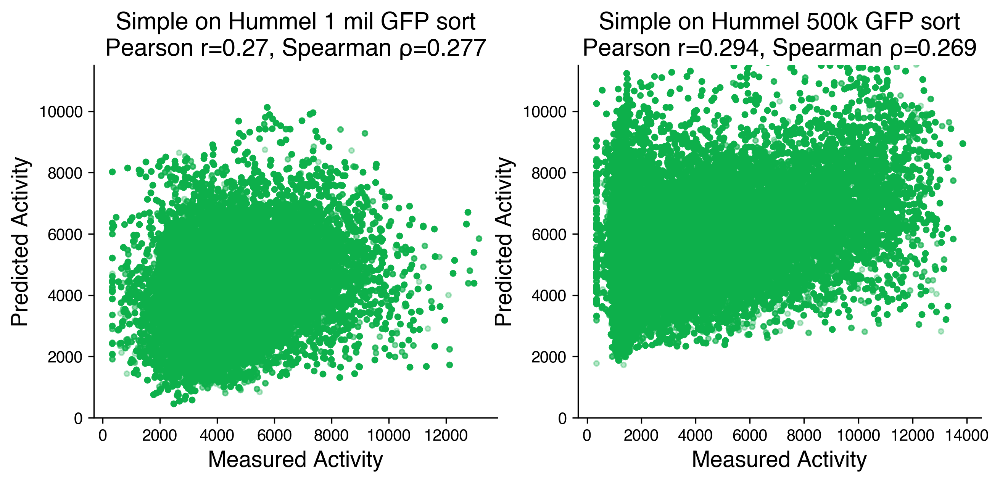

In [24]:
# Hummel 500k GFP sort looks slightly higher quality (both very low quality)

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42


fig, axs = plt.subplots(1,2,figsize=(10,4))

axs[0].scatter(hummel_data["Activity_1mil_GFP_sort"], hummel_data["mean_simple_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(hummel_data["Activity_1mil_GFP_sort"], hummel_data["mean_simple_pred"]).correlation
pearson = pearsonr(hummel_data["Activity_1mil_GFP_sort"], hummel_data["mean_simple_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[0].set_xlabel('Measured Activity', fontsize=14)
axs[0].set_ylabel('Predicted Activity', fontsize=14)
axs[0].set_ylim(0, 11500)
axs[0].set_title(f'Simple on Hummel 1 mil GFP sort\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[1].scatter(hummel_data["Activity_500k_GFP_sort"], hummel_data["mean_adhunter_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_simple_pred"]).correlation
pearson = pearsonr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_simple_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[1].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
axs[1].set_ylim(0, 11500)
axs[1].set_title(f'Simple on Hummel 500k GFP sort\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

sns.despine()

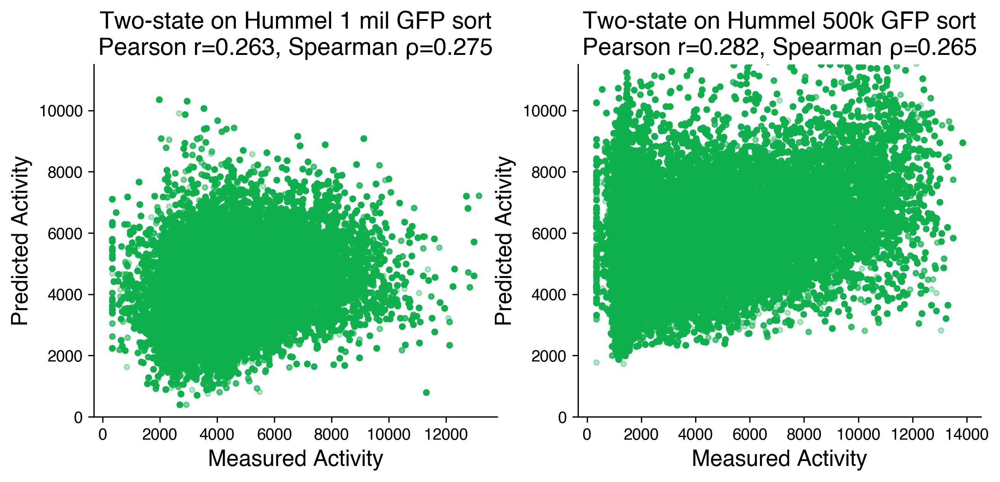

In [25]:
# Two state generalizes better than simple

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42


fig, axs = plt.subplots(1,2,figsize=(10,4))

axs[0].scatter(hummel_data["Activity_1mil_GFP_sort"], hummel_data["mean_two_state_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(hummel_data["Activity_1mil_GFP_sort"], hummel_data["mean_two_state_pred"]).correlation
pearson = pearsonr(hummel_data["Activity_1mil_GFP_sort"], hummel_data["mean_two_state_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[0].set_xlabel('Measured Activity', fontsize=14)
axs[0].set_ylabel('Predicted Activity', fontsize=14)
axs[0].set_ylim(0, 11500)
axs[0].set_title(f'Two-state on Hummel 1 mil GFP sort\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[1].scatter(hummel_data["Activity_500k_GFP_sort"], hummel_data["mean_adhunter_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_two_state_pred"]).correlation
pearson = pearsonr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_two_state_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[1].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
axs[1].set_ylim(0, 11500)
axs[1].set_title(f'Two-state on Hummel 500k GFP sort\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

sns.despine()

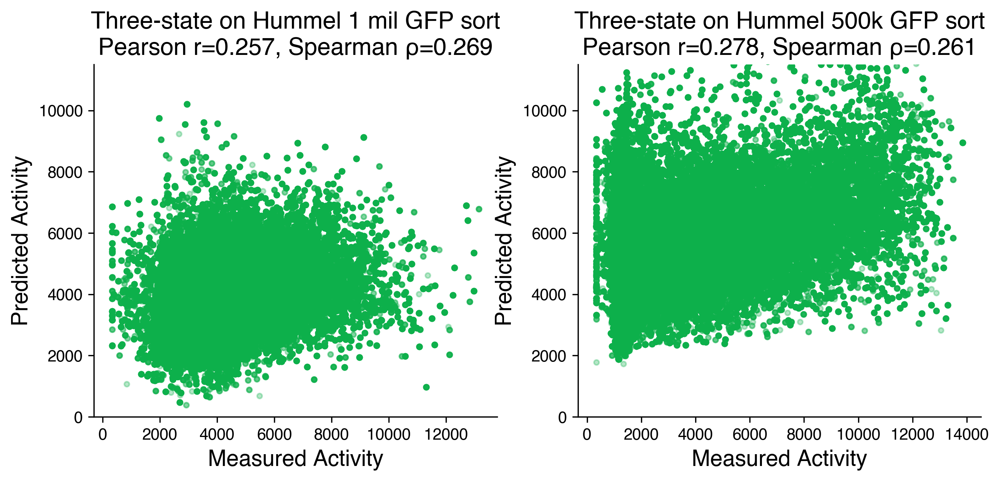

In [26]:
# Three state generalizes better than simple

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42


fig, axs = plt.subplots(1,2,figsize=(10,4))

axs[0].scatter(hummel_data["Activity_1mil_GFP_sort"], hummel_data["mean_three_state_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(hummel_data["Activity_1mil_GFP_sort"], hummel_data["mean_three_state_pred"]).correlation
pearson = pearsonr(hummel_data["Activity_1mil_GFP_sort"], hummel_data["mean_three_state_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[0].set_xlabel('Measured Activity', fontsize=14)
axs[0].set_ylabel('Predicted Activity', fontsize=14)
axs[0].set_ylim(0, 11500)
axs[0].set_title(f'Three-state on Hummel 1 mil GFP sort\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[1].scatter(hummel_data["Activity_500k_GFP_sort"], hummel_data["mean_adhunter_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_three_state_pred"]).correlation
pearson = pearsonr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_three_state_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[1].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
axs[1].set_ylim(0, 11500)
axs[1].set_title(f'Three-state on Hummel 500k GFP sort\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

sns.despine()

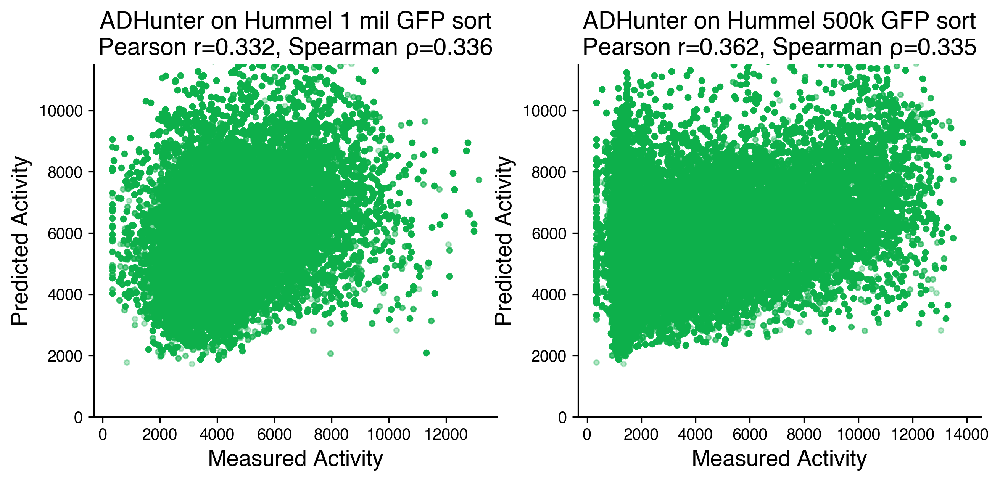

In [27]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42


fig, axs = plt.subplots(1,2,figsize=(10,4))

axs[0].scatter(hummel_data["Activity_1mil_GFP_sort"], hummel_data["mean_adhunter_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(hummel_data["Activity_1mil_GFP_sort"], hummel_data["mean_adhunter_pred"]).correlation
pearson = pearsonr(hummel_data["Activity_1mil_GFP_sort"], hummel_data["mean_adhunter_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[0].set_xlabel('Measured Activity', fontsize=14)
axs[0].set_ylabel('Predicted Activity', fontsize=14)
axs[0].set_ylim(0, 11500)
axs[0].set_title(f'ADHunter on Hummel 1 mil GFP sort\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[1].scatter(hummel_data["Activity_500k_GFP_sort"], hummel_data["mean_adhunter_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_adhunter_pred"]).correlation
pearson = pearsonr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_adhunter_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[1].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
axs[1].set_ylim(0, 11500)
axs[1].set_title(f'ADHunter on Hummel 500k GFP sort\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

sns.despine()

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


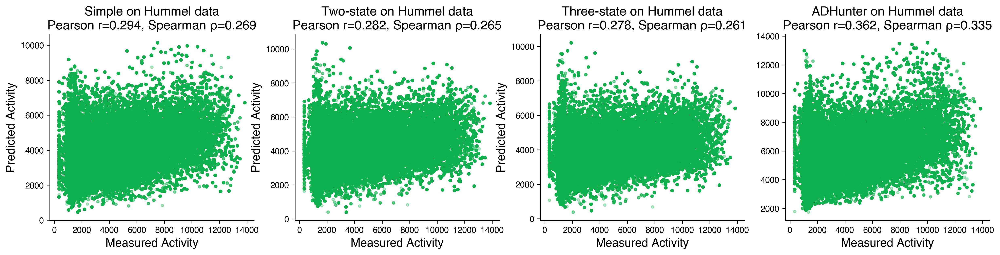

In [28]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42


fig, axs = plt.subplots(1,4,figsize=(20,4))

axs[0].scatter(hummel_data["Activity_500k_GFP_sort"], hummel_data["mean_simple_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_simple_pred"]).correlation
pearson = pearsonr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_simple_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[0].set_xlabel('Measured Activity', fontsize=14)
axs[0].set_ylabel('Predicted Activity', fontsize=14)
# axs[0].set_ylim(0, 11500)
axs[0].set_title(f'Simple on Hummel data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[1].scatter(hummel_data["Activity_500k_GFP_sort"], hummel_data["mean_two_state_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_two_state_pred"]).correlation
pearson = pearsonr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_two_state_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[1].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[1].set_title(f'Two-state on Hummel data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[2].scatter(hummel_data["Activity_500k_GFP_sort"], hummel_data["mean_three_state_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_three_state_pred"]).correlation
pearson = pearsonr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_three_state_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[2].set_xlabel('Measured Activity', fontsize=14)
axs[2].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[2].set_title(f'Three-state on Hummel data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[3].scatter(hummel_data["Activity_500k_GFP_sort"], hummel_data["mean_adhunter_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_adhunter_pred"]).correlation
pearson = pearsonr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()["mean_adhunter_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[3].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[3].set_title(f'ADHunter on Hummel data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)


sns.despine()
plt.savefig("figures/for_revision/hummel_scatters.pdf",  format='pdf', bbox_inches='tight')
plt.savefig("figures/for_revision/hummel_scatters.png",  format='png', bbox_inches='tight')

In [29]:
pearsonr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()['PADDLE_pred'])

PearsonRResult(statistic=0.3402304447595545, pvalue=0.0)

In [30]:
spearmanr(hummel_data.dropna()["Activity_500k_GFP_sort"], hummel_data.dropna()['PADDLE_pred'])

SignificanceResult(statistic=0.33901761267694197, pvalue=0.0)

In [31]:
hummel_data['simple_gfp_pred_max'] = [max(ls) for ls in hummel_data['simple_gfp_pred'] ]
hummel_data['two_state_gfp_pred_max'] = [max(ls) for ls in hummel_data['two_state_gfp_pred'] ]
hummel_data['three_state_gfp_pred_max'] = [max(ls) for ls in hummel_data['three_state_gfp_pred'] ]
hummel_data['adhunter_gfp_pred_max'] = [max(ls) for ls in hummel_data['adhunter_gfp_pred'] ]

hummel_data['simple_gfp_pred_mean'] = [np.mean(ls) for ls in hummel_data['simple_gfp_pred'] ]
hummel_data['two_state_gfp_pred_mean'] = [np.mean(ls) for ls in hummel_data['two_state_gfp_pred'] ]
hummel_data['three_state_gfp_pred_mean'] = [np.mean(ls) for ls in hummel_data['three_state_gfp_pred'] ]
hummel_data['adhunter_gfp_pred_mean'] = [np.mean(ls) for ls in hummel_data['adhunter_gfp_pred'] ]

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


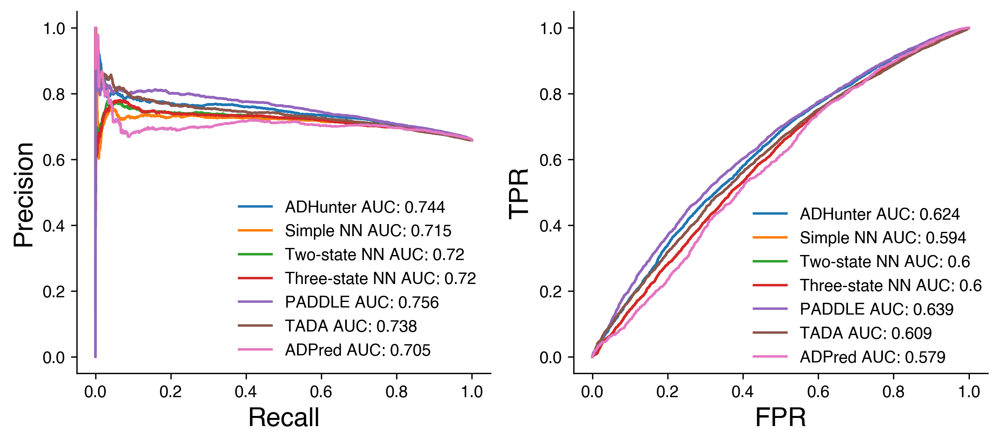

In [32]:
fig, axs = plt.subplots(1,2,figsize=(10,4))

experimental_measures = hummel_data['Activity_500k_GFP_sort']
experimental_labels = [i > 2000 for i in experimental_measures]

simple_measures = hummel_data['simple_gfp_pred_mean']
precision_b, recall_b, thresholds_b = precision_recall_curve(experimental_labels, simple_measures)
fpr_b, tpr_b, thresholds_b = roc_curve(experimental_labels, simple_measures)

two_state_measures = hummel_data['two_state_gfp_pred_mean']
precision_two, recall_two, thresholds_two = precision_recall_curve(experimental_labels, two_state_measures)
fpr_two, tpr_two, thresholds_two = roc_curve(experimental_labels, two_state_measures)

three_state_measures = hummel_data['three_state_gfp_pred_mean']
precision_three, recall_three, thresholds_three = precision_recall_curve(experimental_labels, three_state_measures)
fpr_three, tpr_three, thresholds_three = roc_curve(experimental_labels, three_state_measures)

paddle_measures = hummel_data['PADDLE_pred']
precision_p, recall_p, thresholds_p = precision_recall_curve(experimental_labels, paddle_measures)
fpr_p, tpr_p, thresholds_b = roc_curve(experimental_labels, paddle_measures)

adhunter_measures =  hummel_data['adhunter_gfp_pred_mean']
precision_a, recall_a, thresholds_a = precision_recall_curve(experimental_labels, adhunter_measures)
fpr_a, tpr_a, thresholds_a = roc_curve(experimental_labels, adhunter_measures)

tada_measures = hummel_data['tada_preds']

precision_t, recall_t, thresholds_t = precision_recall_curve(experimental_labels, tada_measures)
fpr_t, tpr_t, thresholds_t = roc_curve(experimental_labels, tada_measures)

adpred_measures = hummel_data['adpred_preds_max']
precision_ad, recall_ad, thresholds_ad = precision_recall_curve(experimental_labels, adpred_measures)
fpr_ad, tpr_ad, thresholds_ad = roc_curve(experimental_labels, adpred_measures)


simple_auc_pr = auc(recall_b, precision_b)
two_auc_pr = auc(recall_two, precision_two)
three_auc_pr = auc(recall_three, precision_three)
adhunter_auc_pr = auc(recall_a, precision_a)
paddle_auc_pr = auc(recall_p, precision_p)
tada_auc_pr = auc(recall_t, precision_t)
adpred_auc_pr = auc(recall_ad, precision_ad)

simple_auc_roc = auc(fpr_b, tpr_b)
two_auc_roc = auc(fpr_two, tpr_two)
three_auc_roc = auc(fpr_three, tpr_three)
adhunter_auc_roc = auc(fpr_a, tpr_a)
paddle_auc_roc = auc(fpr_p, tpr_p)
tada_auc_roc = auc(fpr_t, tpr_t)
adpred_auc_roc = auc(fpr_ad, tpr_ad)

axs[0].plot(recall_a, precision_a, label=f"ADHunter AUC: {adhunter_auc_pr:.3}")
axs[0].plot(recall_b, precision_b, label=f"Simple NN AUC: {simple_auc_pr:.3}")
axs[0].plot(recall_two, precision_two, label=f"Two-state NN AUC: {two_auc_pr:.3}")
axs[0].plot(recall_three, precision_three, label=f"Three-state NN AUC: {three_auc_pr:.3}")
axs[0].plot(recall_p, precision_p, label=f"PADDLE AUC: {paddle_auc_pr:.3}")
axs[0].plot(recall_t, precision_t, label=f"TADA AUC: {tada_auc_pr:.3}")
axs[0].plot(recall_ad, precision_ad, label=f"ADPred AUC: {adpred_auc_pr:.3}")

axs[0].legend(fontsize="10", frameon=False)
axs[0].set_xlabel("Recall", fontsize=16)
axs[0].set_ylabel("Precision", fontsize=16)

axs[1].plot(fpr_a,tpr_a,  label=f"ADHunter AUC: {adhunter_auc_roc:.3}")
axs[1].plot(fpr_b, tpr_b, label=f"Simple NN AUC: {simple_auc_roc:.3}")
axs[1].plot(fpr_b, tpr_b, label=f"Two-state NN AUC: {two_auc_roc:.3}")
axs[1].plot(fpr_b, tpr_b, label=f"Three-state NN AUC: {three_auc_roc:.3}")
axs[1].plot(fpr_p, tpr_p, label=f"PADDLE AUC: {paddle_auc_roc:.3}")
axs[1].plot(fpr_t, tpr_t, label=f"TADA AUC: {tada_auc_roc:.3}")
axs[1].plot(fpr_ad, tpr_ad, label=f"ADPred AUC: {adpred_auc_roc:.3}")

axs[1].legend(fontsize="10", frameon=False, bbox_to_anchor = (0.4, 0.5))
axs[1].set_xlabel("FPR", fontsize=16)
axs[1].set_ylabel("TPR", fontsize=16)

# fig.suptitle("Centered and Smoothed Data")
sns.despine()
plt.savefig(f"figures/for_revision/hummel_AUC_plots.pdf", format='pdf', bbox_inches='tight')

# Marissa data

Will be added in final version of manuscript

In [48]:
marissa_data = pd.read_csv("Data/Synthetics_GFP.csv", index_col=0)
marissa_data = marissa_data.reset_index().rename({'AAseq' : 'aa_seq'}, axis=1)
marissa_data

,aa_seq,GFP_Activity,GFP_StdDev,NumReps,Ctrl,NegCtrl
0,AAAAAIACELRTDNYFEYPDLSILDALDNDSDETMSLIDE,2998.900453,NaN,1,0,0
1,AAAAASDHSDVNDIIELGGLSNRLYDFYSDLEDIENDIAV,3296.634571,NaN,1,0,0
2,AAADGASFSDDTDEDLYKYDPWDLPGLSVIKTDDPEWFFF,7699.309003,807.776558,4,0,0
3,AAADGASFSDDTDEDLYKYDPWELPSKASFGEQEWYFFSP,5480.599003,1011.252956,4,0,0
4,AAADGPDCDTREFCELRDSLLWNESCFLLDDDKRFDVSEN,6164.547720,NaN,1,0,0
...,...,...,...,...,...,...
16681,YYSDDIMLDLGVDLSNFQFDFRYFGLDSPLSPPWNEDDDS,13805.477165,1177.165879,3,0,0
16682,YYSEQSCYLDLDLDLDITFLDFSQFLEQLLQSKNDPLVSE,13686.365240,NaN,2,0,0
16683,YYSEQSCYLNFPPLDCVDLVATLSEKFKSFSQLLLDFPIS,501.915275,NaN,1,0,0
16684,YYSEQSCYLNFPPLDMFPALPSDLSGWVESMLSELNNPAS,7394.455744,NaN,2,0,0


In [50]:
marissa_paddle = pd.read_csv("Data/PlantSyntheticsADs53_PADDLE-noSS_preds.csv", index_col=0)
marissa_paddle = marissa_paddle.rename({'pred' : 'paddle', 'seq' : '53mer'}, axis=1)
marissa_paddle["40mer"] = marissa_paddle['53mer'].str[-40:]
marissa_paddle["40mer"]

0        MLDEEGLLLDEDTEVFSTAEAVSDEEALEDLFNSQNLMSP
1        CFALFSDEDELEDDSDIEEISESFWAMELRMNLESLDTIL
2        RTDLHFDLQEEVDIGLDSFEADILDFAKTDKEFQSLLVKG
3        LDRLKELDDFDDHLLSSDVDEDSACYDFTFGLCFSKLFDG
4        SDEQLELSEKQSYSDLDYKAEGLDSFPDAVQLWFPFLLDI
                           ...                   
18949    AALDVALALSQPETKPAKEVSVPPSPAIRNSASPAPSPAP
18950    DDAVVESAASSSTDSTPAAEAENAEDNSKEATSAADNDIP
18951    DDAVVESAASSSTDSTPMAEAENLEDNSKEATSLADNDIP
18952    PPTDVSAGDEAHADGEDVAMAHADAADDFDADMAGDGDSP
18953    DVTPASPMIRTTSSRATSPSARSVTKPSHVAGVNARQRKP
Name: 40mer, Length: 18954, dtype: object

In [51]:
marissa_data = marissa_data.merge(marissa_paddle, left_on='aa_seq', right_on='40mer')

In [52]:
marissa_adpred = pd.read_csv("Data/00ADpred_preds.csv", index_col=0, converters={'adpred_preds' : pd.eval})
marissa_adpred['adpred_preds_max'] = [np.max(ls) for ls in marissa_adpred['adpred_preds']]
marissa_adpred = marissa_adpred.rename({'sequence' : 'aa_seq'}, axis = 1)

In [53]:
marissa_data = marissa_data.merge(marissa_adpred, on='aa_seq')

In [54]:
marissa_tada = pd.read_csv("Data/PoojaUpdateTADA_preds.csv")
marissa_tada = marissa_tada.drop('tada_centers', axis=1)
marissa_tada['tada_preds'] = [float(ls.replace("[", "").replace(']', "")) for ls in marissa_tada['tada_preds']]
marissa_tada = marissa_tada.rename({'sequence' : 'aa_seq'}, axis=1)

In [55]:
marissa_data = marissa_data.merge(marissa_tada, on='aa_seq')

In [56]:
marissa_data["simple_gfp_pred"] = [run_biophysical_model(simple_model, tile)[0][0] for tile in marissa_data["aa_seq"]]
marissa_data["two_state_gfp_pred"] = [run_biophysical_model(two_state_biophysical_model, tile)[0][1] for tile in marissa_data["aa_seq"]]
marissa_data["three_state_gfp_pred"] = [run_biophysical_model(three_state_biophysical_model, tile)[0][1] for tile in marissa_data["aa_seq"]]

marissa_data["adhunter_gfp_pred"] = [run_adhunter(gfp_model, tile, sc_gfp) for tile in marissa_data["aa_seq"]]

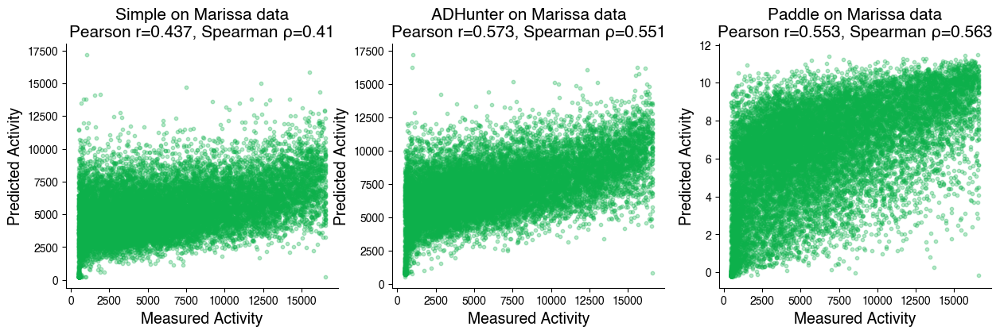

In [57]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42


fig, axs = plt.subplots(1,3,figsize=(15,4))

axs[0].scatter(marissa_data["GFP_Activity"], marissa_data["simple_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(marissa_data["GFP_Activity"], marissa_data["simple_gfp_pred"]).correlation
pearson = pearsonr(marissa_data["GFP_Activity"], marissa_data["simple_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[0].set_xlabel('Measured Activity', fontsize=14)
axs[0].set_ylabel('Predicted Activity', fontsize=14)
# axs[0].set_ylim(0, 11500)
axs[0].set_title(f'Simple on Marissa data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)


axs[1].scatter(marissa_data["GFP_Activity"], marissa_data["adhunter_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["adhunter_gfp_pred"]).correlation
pearson = pearsonr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["adhunter_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[1].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[1].set_title(f'ADHunter on Marissa data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[2].scatter(marissa_data["GFP_Activity"], marissa_data["paddle"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["paddle"]).correlation
pearson = pearsonr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["paddle"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[2].set_xlabel('Measured Activity', fontsize=14)
axs[2].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[2].set_title(f'Paddle on Marissa data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)


sns.despine()

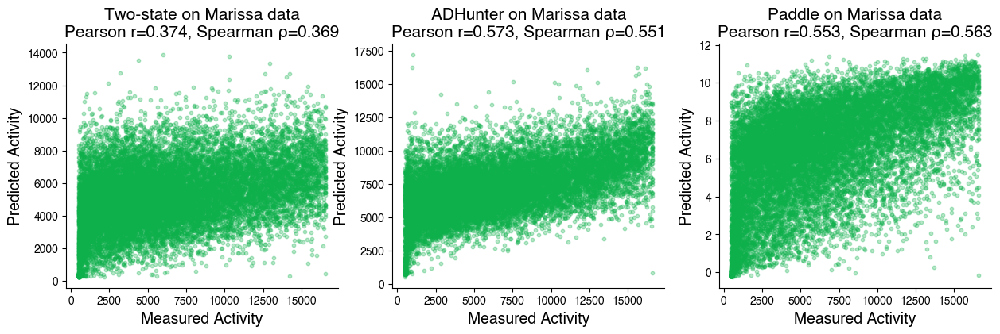

In [58]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42


fig, axs = plt.subplots(1,3,figsize=(15,4))

axs[0].scatter(marissa_data["GFP_Activity"], marissa_data["two_state_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(marissa_data["GFP_Activity"], marissa_data["two_state_gfp_pred"]).correlation
pearson = pearsonr(marissa_data["GFP_Activity"], marissa_data["two_state_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[0].set_xlabel('Measured Activity', fontsize=14)
axs[0].set_ylabel('Predicted Activity', fontsize=14)
# axs[0].set_ylim(0, 11500)
axs[0].set_title(f'Two-state on Marissa data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)


axs[1].scatter(marissa_data["GFP_Activity"], marissa_data["adhunter_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["adhunter_gfp_pred"]).correlation
pearson = pearsonr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["adhunter_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[1].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[1].set_title(f'ADHunter on Marissa data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[2].scatter(marissa_data["GFP_Activity"], marissa_data["paddle"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["paddle"]).correlation
pearson = pearsonr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["paddle"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[2].set_xlabel('Measured Activity', fontsize=14)
axs[2].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[2].set_title(f'Paddle on Marissa data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)


sns.despine()

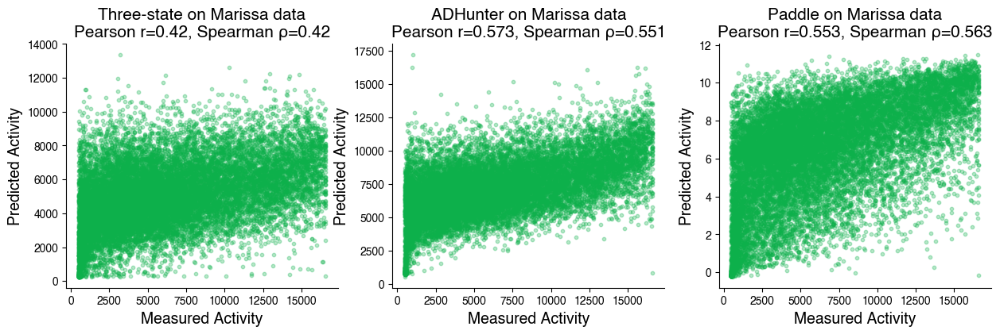

In [59]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42


fig, axs = plt.subplots(1,3,figsize=(15,4))

axs[0].scatter(marissa_data["GFP_Activity"], marissa_data["three_state_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(marissa_data["GFP_Activity"], marissa_data["three_state_gfp_pred"]).correlation
pearson = pearsonr(marissa_data["GFP_Activity"], marissa_data["three_state_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[0].set_xlabel('Measured Activity', fontsize=14)
axs[0].set_ylabel('Predicted Activity', fontsize=14)
# axs[0].set_ylim(0, 11500)
axs[0].set_title(f'Three-state on Marissa data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)


axs[1].scatter(marissa_data["GFP_Activity"], marissa_data["adhunter_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["adhunter_gfp_pred"]).correlation
pearson = pearsonr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["adhunter_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[1].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[1].set_title(f'ADHunter on Marissa data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[2].scatter(marissa_data["GFP_Activity"], marissa_data["paddle"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["paddle"]).correlation
pearson = pearsonr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["paddle"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[2].set_xlabel('Measured Activity', fontsize=14)
axs[2].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[2].set_title(f'Paddle on Marissa data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)


sns.despine()

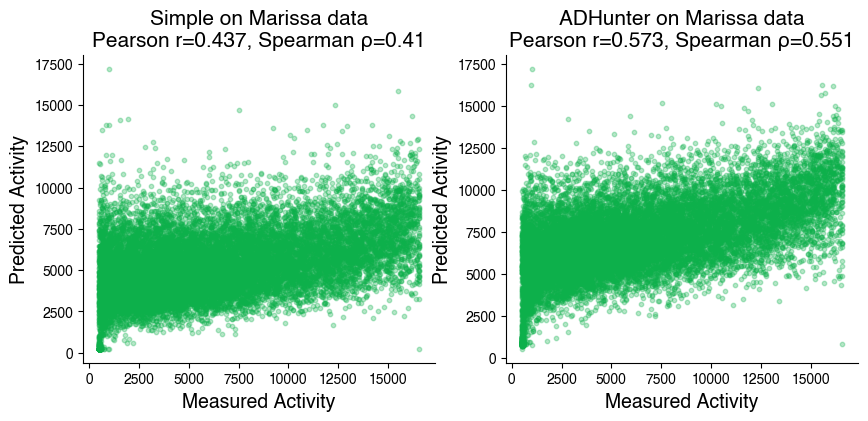

In [60]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42


fig, axs = plt.subplots(1,2,figsize=(10,4))

axs[0].scatter(marissa_data["GFP_Activity"], marissa_data["simple_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(marissa_data["GFP_Activity"], marissa_data["simple_gfp_pred"]).correlation
pearson = pearsonr(marissa_data["GFP_Activity"], marissa_data["simple_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[0].set_xlabel('Measured Activity', fontsize=14)
axs[0].set_ylabel('Predicted Activity', fontsize=14)
# axs[0].set_ylim(0, 11500)
axs[0].set_title(f'Simple on Marissa data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)


axs[1].scatter(marissa_data["GFP_Activity"], marissa_data["adhunter_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["adhunter_gfp_pred"]).correlation
pearson = pearsonr(marissa_data.dropna()["GFP_Activity"], marissa_data.dropna()["adhunter_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[1].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[1].set_title(f'ADHunter on Marissa data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)


sns.despine()

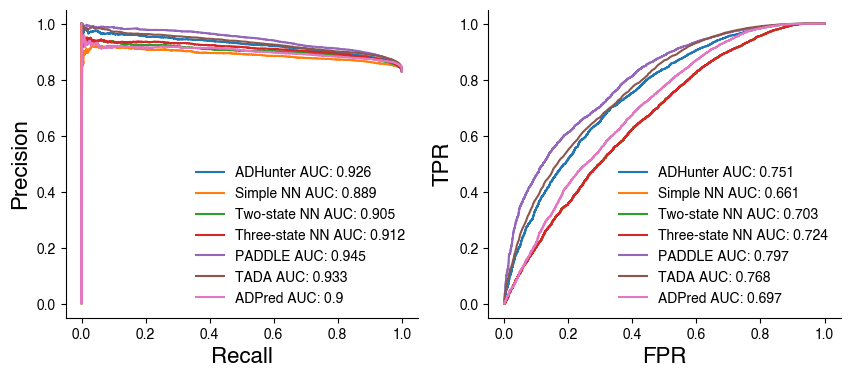

In [61]:
fig, axs = plt.subplots(1,2,figsize=(10,4))

experimental_measures = marissa_data['GFP_Activity']
experimental_labels = [i > 2000 for i in experimental_measures]

simple_measures = marissa_data['simple_gfp_pred']
precision_b, recall_b, thresholds_b = precision_recall_curve(experimental_labels, simple_measures)
fpr_b, tpr_b, thresholds_b = roc_curve(experimental_labels, simple_measures)

two_state_measures = marissa_data['two_state_gfp_pred']
precision_two, recall_two, thresholds_two = precision_recall_curve(experimental_labels, two_state_measures)
fpr_two, tpr_two, thresholds_two = roc_curve(experimental_labels, two_state_measures)

three_state_measures = marissa_data['three_state_gfp_pred']
precision_three, recall_three, thresholds_three = precision_recall_curve(experimental_labels, three_state_measures)
fpr_three, tpr_three, thresholds_three = roc_curve(experimental_labels, three_state_measures)

paddle_measures = marissa_data['paddle']
precision_p, recall_p, thresholds_p = precision_recall_curve(experimental_labels, paddle_measures)
fpr_p, tpr_p, thresholds_b = roc_curve(experimental_labels, paddle_measures)

adhunter_measures =  marissa_data['adhunter_gfp_pred']
precision_a, recall_a, thresholds_a = precision_recall_curve(experimental_labels, adhunter_measures)
fpr_a, tpr_a, thresholds_a = roc_curve(experimental_labels, adhunter_measures)

tada_measures = marissa_data['tada_preds']

precision_t, recall_t, thresholds_t = precision_recall_curve(experimental_labels, tada_measures)
fpr_t, tpr_t, thresholds_t = roc_curve(experimental_labels, tada_measures)

adpred_measures = marissa_data['adpred_preds_max']
precision_ad, recall_ad, thresholds_ad = precision_recall_curve(experimental_labels, adpred_measures)
fpr_ad, tpr_ad, thresholds_ad = roc_curve(experimental_labels, adpred_measures)


simple_auc_pr = auc(recall_b, precision_b)
two_auc_pr = auc(recall_two, precision_two)
three_auc_pr = auc(recall_three, precision_three)
adhunter_auc_pr = auc(recall_a, precision_a)
paddle_auc_pr = auc(recall_p, precision_p)
tada_auc_pr = auc(recall_t, precision_t)
adpred_auc_pr = auc(recall_ad, precision_ad)

simple_auc_roc = auc(fpr_b, tpr_b)
two_auc_roc = auc(fpr_two, tpr_two)
three_auc_roc = auc(fpr_three, tpr_three)
adhunter_auc_roc = auc(fpr_a, tpr_a)
paddle_auc_roc = auc(fpr_p, tpr_p)
tada_auc_roc = auc(fpr_t, tpr_t)
adpred_auc_roc = auc(fpr_ad, tpr_ad)

axs[0].plot(recall_a, precision_a, label=f"ADHunter AUC: {adhunter_auc_pr:.3}")
axs[0].plot(recall_b, precision_b, label=f"Simple NN AUC: {simple_auc_pr:.3}")
axs[0].plot(recall_two, precision_two, label=f"Two-state NN AUC: {two_auc_pr:.3}")
axs[0].plot(recall_three, precision_three, label=f"Three-state NN AUC: {three_auc_pr:.3}")
axs[0].plot(recall_p, precision_p, label=f"PADDLE AUC: {paddle_auc_pr:.3}")
axs[0].plot(recall_t, precision_t, label=f"TADA AUC: {tada_auc_pr:.3}")
axs[0].plot(recall_ad, precision_ad, label=f"ADPred AUC: {adpred_auc_pr:.3}")

axs[0].legend(fontsize="10", frameon=False)
axs[0].set_xlabel("Recall", fontsize=16)
axs[0].set_ylabel("Precision", fontsize=16)

axs[1].plot(fpr_a,tpr_a,  label=f"ADHunter AUC: {adhunter_auc_roc:.3}")
axs[1].plot(fpr_b, tpr_b, label=f"Simple NN AUC: {simple_auc_roc:.3}")
axs[1].plot(fpr_b, tpr_b, label=f"Two-state NN AUC: {two_auc_roc:.3}")
axs[1].plot(fpr_b, tpr_b, label=f"Three-state NN AUC: {three_auc_roc:.3}")
axs[1].plot(fpr_p, tpr_p, label=f"PADDLE AUC: {paddle_auc_roc:.3}")
axs[1].plot(fpr_t, tpr_t, label=f"TADA AUC: {tada_auc_roc:.3}")
axs[1].plot(fpr_ad, tpr_ad, label=f"ADPred AUC: {adpred_auc_roc:.3}")

axs[1].legend(fontsize="10", frameon=False)
axs[1].set_xlabel("FPR", fontsize=16)
axs[1].set_ylabel("TPR", fontsize=16)

# fig.suptitle("Centered and Smoothed Data")
sns.despine()
# plt.savefig(f"figures/simple_AUC_plots.pdf", format='pdf', bbox_inches='tight')

# PADI data

In [35]:
PADI_data = pd.read_csv("Data/PADI_ScaleScore_data_wrangled.csv", index_col=0)
PADI_data

,aa_seq,abundance,activity
2,LRNKIEGNTSRDVEVAISEVNICSYDPWNLRFQSKYKSRD,1.765059,-0.764495
3,RDVEVAISEVNICSYDPWNLRFQSKYKSRDAMWYFFSRRE,-0.761484,-0.913925
4,NICSYDPWNLRFQSKYKSRDAMWYFFSRRENNKGNRQSRT,-0.316578,-0.637390
5,RFQSKYKSRDAMWYFFSRRENNKGNRQSRTTVSGKWKLTG,-0.182440,-0.189105
6,AMWYFFSRRENNKGNRQSRTTVSGKWKLTGESVEVKDQWG,-0.201822,0.315959
...,...,...,...
69521,SDFVVKAEDVEASMAIFWTPGTRVKMAMETEDSSRITWFQ,0.237077,-0.031522
69522,EASMAIFWTPGTRVKMAMETEDSSRITWFQGIVFYTYQET,-0.968627,-0.712330
69523,GTRVKMAMETEDSSRITWFQGIVFYTYQETGPWRGSPWNS,0.416401,-0.980707
69524,EDSSRITWFQGIVFYTYQETGPWRGSPWNSFRYKIPFTIP,1.107537,0.496633


In [36]:
PADI_data["simple_gfp_pred"] = [run_biophysical_model(simple_model, tile)[0][0] for tile in PADI_data["aa_seq"]]
PADI_data["adhunter_gfp_pred"] = [run_adhunter(gfp_model, tile, sc_gfp) for tile in PADI_data["aa_seq"]]

In [37]:
PADI_data["two_state_gfp_pred"] = [run_biophysical_model(two_state_biophysical_model, tile)[0][1] for tile in PADI_data["aa_seq"]]
PADI_data["three_state_gfp_pred"] = [run_biophysical_model(three_state_biophysical_model, tile)[0][1] for tile in PADI_data["aa_seq"]]

In [38]:
# Loading in PADDLE and ADPred predictions
paddle_padi = pd.read_csv("Data/PADI_PADDLE_ADpred_53_preds.csv", index_col=0, converters={'adpred_preds' : pd.eval})

paddle_padi['paddle_preds'] = [float(ls.replace("]","").replace("[","")) for ls in paddle_padi['paddle_preds']]
paddle_padi['adpred_preds_max'] = [max(ls) for ls in paddle_padi['adpred_preds']]
paddle_padi = paddle_padi.rename({'sequence' : '53mer'}, axis = 1)
paddle_padi['aa_seq'] = paddle_padi["53mer"].str[-40:]

In [39]:
PADI_data = PADI_data.merge(paddle_padi, on='aa_seq')

In [40]:
# Loading in TADA predictions
tada_padi = pd.read_csv("Data/PADI_TADA_Predictions.csv", index_col=0)
tada_padi = tada_padi.rename({'sequences' : 'aa_seq', 'predictions' : 'tada_preds'}, axis=1)

In [41]:
PADI_data = PADI_data.merge(tada_padi, on='aa_seq')

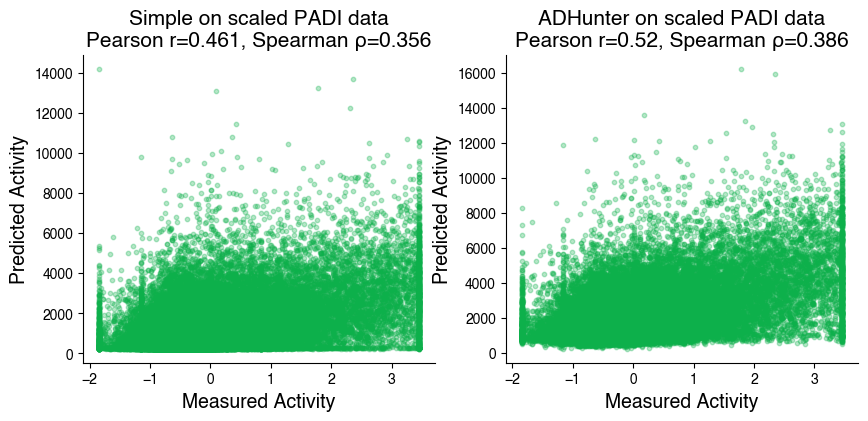

In [70]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42


fig, axs = plt.subplots(1,2,figsize=(10,4))

axs[0].scatter(PADI_data["activity"], PADI_data["simple_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(PADI_data["activity"], PADI_data["simple_gfp_pred"]).correlation
pearson = pearsonr(PADI_data["activity"], PADI_data["simple_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[0].set_xlabel('Measured Activity', fontsize=14)
axs[0].set_ylabel('Predicted Activity', fontsize=14)
# axs[0].set_ylim(0, 11500)
axs[0].set_title(f'Simple on scaled PADI data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)


axs[1].scatter(PADI_data["activity"], PADI_data["adhunter_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(PADI_data.dropna()["activity"], PADI_data.dropna()["adhunter_gfp_pred"]).correlation
pearson = pearsonr(PADI_data.dropna()["activity"], PADI_data.dropna()["adhunter_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[1].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[1].set_title(f'ADHunter on scaled PADI data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)


sns.despine()

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


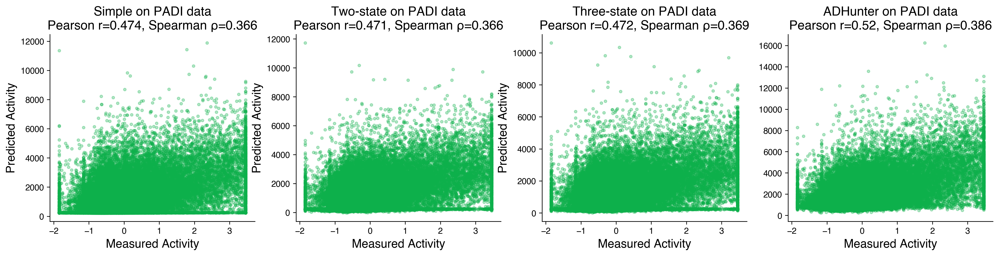

In [42]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42


fig, axs = plt.subplots(1,4,figsize=(20,4))

axs[0].scatter(PADI_data["activity"], PADI_data["simple_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(PADI_data["activity"], PADI_data["simple_gfp_pred"]).correlation
pearson = pearsonr(PADI_data["activity"], PADI_data["simple_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[0].set_xlabel('Measured Activity', fontsize=14)
axs[0].set_ylabel('Predicted Activity', fontsize=14)
# axs[0].set_ylim(0, 11500)
axs[0].set_title(f'Simple on PADI data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[1].scatter(PADI_data["activity"], PADI_data["two_state_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(PADI_data.dropna()["activity"], PADI_data.dropna()["two_state_gfp_pred"]).correlation
pearson = pearsonr(PADI_data.dropna()["activity"], PADI_data.dropna()["two_state_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[1].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[1].set_title(f'Two-state on PADI data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[2].scatter(PADI_data["activity"], PADI_data["three_state_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(PADI_data.dropna()["activity"], PADI_data.dropna()["three_state_gfp_pred"]).correlation
pearson = pearsonr(PADI_data.dropna()["activity"], PADI_data.dropna()["three_state_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[2].set_xlabel('Measured Activity', fontsize=14)
axs[2].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[2].set_title(f'Three-state on PADI data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)

axs[3].scatter(PADI_data["activity"], PADI_data["adhunter_gfp_pred"], color='#0DB04B', s=10, alpha=0.3)
spearman = spearmanr(PADI_data.dropna()["activity"], PADI_data.dropna()["adhunter_gfp_pred"]).correlation
pearson = pearsonr(PADI_data.dropna()["activity"], PADI_data.dropna()["adhunter_gfp_pred"]).correlation #np.corrcoef(list(plotting_data["actual"].values), list(plotting_data["pred"].values))[0, 1] 
axs[3].set_xlabel('Measured Activity', fontsize=14)
axs[1].set_ylabel('Predicted Activity', fontsize=14)
# axs[1].set_ylim(0, 11500)
axs[3].set_title(f'ADHunter on PADI data\nPearson r={pearson:.3}, Spearman \u03C1={spearman:.3}', fontsize=15)


sns.despine()
plt.savefig("figures/for_revision/PADI_scatters.pdf",  format='pdf', bbox_inches='tight')
plt.savefig("figures/for_revision/PADI_scatters.png",  format='png', bbox_inches='tight')

In [43]:
spearmanr(PADI_data.dropna()["activity"], PADI_data.dropna()["paddle_preds"]).correlation

0.38619098531584795

In [47]:
pearsonr(PADI_data.dropna()["activity"], PADI_data.dropna()["paddle_preds"]).correlation

0.5200255221776069

In [48]:
spearmanr(PADI_data.dropna()["activity"], PADI_data.dropna()["adhunter_gfp_pred"])

SignificanceResult(statistic=0.38605915837474597, pvalue=0.0)

In [49]:
pearsonr(PADI_data.dropna()["activity"], PADI_data.dropna()["adhunter_gfp_pred"])

PearsonRResult(statistic=0.5197455895274669, pvalue=0.0)

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


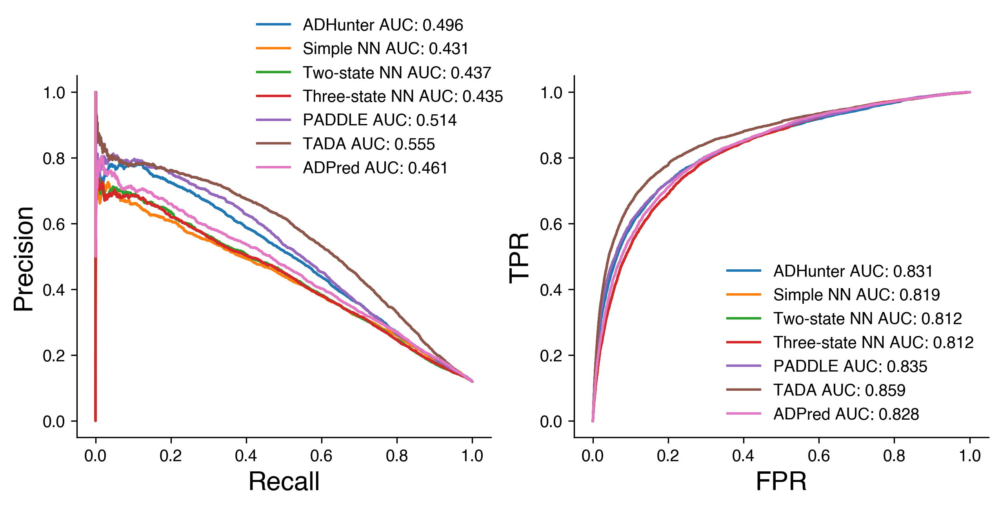

In [50]:
fig, axs = plt.subplots(1,2,figsize=(10,4))

experimental_measures = PADI_data['activity']
experimental_labels = [i > 1 for i in experimental_measures]

simple_measures = PADI_data['simple_gfp_pred']
precision_b, recall_b, thresholds_b = precision_recall_curve(experimental_labels, simple_measures)
fpr_b, tpr_b, thresholds_b = roc_curve(experimental_labels, simple_measures)

two_state_measures = PADI_data['two_state_gfp_pred']
precision_two, recall_two, thresholds_two = precision_recall_curve(experimental_labels, two_state_measures)
fpr_two, tpr_two, thresholds_two = roc_curve(experimental_labels, two_state_measures)

three_state_measures = PADI_data['three_state_gfp_pred']
precision_three, recall_three, thresholds_three = precision_recall_curve(experimental_labels, three_state_measures)
fpr_three, tpr_three, thresholds_three = roc_curve(experimental_labels, three_state_measures)

paddle_measures = PADI_data['paddle_preds']
precision_p, recall_p, thresholds_p = precision_recall_curve(experimental_labels, paddle_measures)
fpr_p, tpr_p, thresholds_b = roc_curve(experimental_labels, paddle_measures)

adhunter_measures =  PADI_data['adhunter_gfp_pred']
precision_a, recall_a, thresholds_a = precision_recall_curve(experimental_labels, adhunter_measures)
fpr_a, tpr_a, thresholds_a = roc_curve(experimental_labels, adhunter_measures)

tada_measures = PADI_data['tada_preds']

precision_t, recall_t, thresholds_t = precision_recall_curve(experimental_labels, tada_measures)
fpr_t, tpr_t, thresholds_t = roc_curve(experimental_labels, tada_measures)

adpred_measures = PADI_data['adpred_preds_max']
precision_ad, recall_ad, thresholds_ad = precision_recall_curve(experimental_labels, adpred_measures)
fpr_ad, tpr_ad, thresholds_ad = roc_curve(experimental_labels, adpred_measures)


simple_auc_pr = auc(recall_b, precision_b)
two_auc_pr = auc(recall_two, precision_two)
three_auc_pr = auc(recall_three, precision_three)
adhunter_auc_pr = auc(recall_a, precision_a)
paddle_auc_pr = auc(recall_p, precision_p)
tada_auc_pr = auc(recall_t, precision_t)
adpred_auc_pr = auc(recall_ad, precision_ad)

simple_auc_roc = auc(fpr_b, tpr_b)
two_auc_roc = auc(fpr_two, tpr_two)
three_auc_roc = auc(fpr_three, tpr_three)
adhunter_auc_roc = auc(fpr_a, tpr_a)
paddle_auc_roc = auc(fpr_p, tpr_p)
tada_auc_roc = auc(fpr_t, tpr_t)
adpred_auc_roc = auc(fpr_ad, tpr_ad)

axs[0].plot(recall_a, precision_a, label=f"ADHunter AUC: {adhunter_auc_pr:.3}")
axs[0].plot(recall_b, precision_b, label=f"Simple NN AUC: {simple_auc_pr:.3}")
axs[0].plot(recall_two, precision_two, label=f"Two-state NN AUC: {two_auc_pr:.3}")
axs[0].plot(recall_three, precision_three, label=f"Three-state NN AUC: {three_auc_pr:.3}")
axs[0].plot(recall_p, precision_p, label=f"PADDLE AUC: {paddle_auc_pr:.3}")
axs[0].plot(recall_t, precision_t, label=f"TADA AUC: {tada_auc_pr:.3}")
axs[0].plot(recall_ad, precision_ad, label=f"ADPred AUC: {adpred_auc_pr:.3}")

axs[0].legend(fontsize="10", bbox_to_anchor = (0.4, 1.2), frameon=False)
axs[0].set_xlabel("Recall", fontsize=16)
axs[0].set_ylabel("Precision", fontsize=16)

axs[1].plot(fpr_a,tpr_a,  label=f"ADHunter AUC: {adhunter_auc_roc:.3}")
axs[1].plot(fpr_b, tpr_b, label=f"Simple NN AUC: {simple_auc_roc:.3}")
axs[1].plot(fpr_b, tpr_b, label=f"Two-state NN AUC: {two_auc_roc:.3}")
axs[1].plot(fpr_b, tpr_b, label=f"Three-state NN AUC: {three_auc_roc:.3}")
axs[1].plot(fpr_p, tpr_p, label=f"PADDLE AUC: {paddle_auc_roc:.3}")
axs[1].plot(fpr_t, tpr_t, label=f"TADA AUC: {tada_auc_roc:.3}")
axs[1].plot(fpr_ad, tpr_ad, label=f"ADPred AUC: {adpred_auc_roc:.3}")

axs[1].legend(fontsize="10", frameon=False)
axs[1].set_xlabel("FPR", fontsize=16)
axs[1].set_ylabel("TPR", fontsize=16)

# fig.suptitle("Centered and Smoothed Data")
sns.despine()
# plt.savefig(f"figures/simple_AUC_plots.pdf", format='pdf', bbox_inches='tight')
plt.savefig("figures/for_revision/PADI_AUC_plots.pdf",  format='pdf', bbox_inches='tight')

In [52]:
three_auc_roc

0.8123525597228006

In [53]:
two_auc_roc

0.8118964338123145

# Sanborn data

In [171]:
sanborn_data = pd.read_excel("/Users/claireleblanc/Downloads/elife-68068-fig5-data1-v3.xlsx", sheet_name="Pulldown, AD mutants")
# sanborn_data = pd.read_excel("/Users/claireleblanc/Downloads/elife-68068-fig5-data1-v3.xlsx")

sanborn_data['tile'] = sanborn_data['protein sequence'].str[-40:]

In [152]:
def run_biophysical_model(loaded_model,sequence):
    encoded_seq = one_hot_encode(sequence).reshape(1,1,40,20)
    seq_tensor = torch.from_numpy(encoded_seq).type(torch.FloatTensor)
    predictions = loaded_model(seq_tensor)
    predictions = predictions.detach().numpy().reshape(1, -1)
    return sc_act.inverse_transform(predictions)

In [153]:
def get_Ks(loaded_model,sequence):
    encoded_seq = one_hot_encode(sequence).reshape(1,1,40,20)
    seq_tensor = torch.from_numpy(encoded_seq).type(torch.FloatTensor)
    predictions = loaded_model(seq_tensor)
    predictions = predictions.detach().numpy().reshape(1, -1)
    return loaded_model.get_ks()[0].detach().numpy()

In [185]:
sanborn_data["two_state_gfp_pred"] = [run_biophysical_model(two_state_biophysical_model, tile)[0][1] for tile in sanborn_data["tile"]]
sanborn_data["two_state_mcherry_pred"] = [run_biophysical_model(two_state_biophysical_model, tile)[0][0] for tile in sanborn_data["tile"]]
sanborn_data["two_state_K"] = [get_Ks(two_state_biophysical_model, tile)[0][0] for tile in sanborn_data["tile"]]


In [186]:
sanborn_data["bound"] = sanborn_data['two_state_mcherry_pred'] / (1 / sanborn_data['two_state_K'] + 1)
sanborn_data

,Unnamed: 0,protein sequence,Med15 pulldown,Med15 enrichment,Med15 Z score,Med15 pulldown rep1,Med15 pulldown rep2,Med15 pulldown rep3,Med15 enrichment rep1,Med15 enrichment rep2,...,TFIID pulldown rep1,TFIID pulldown rep2,TFIID enrichment rep1,TFIID enrichment rep2,DNA,tile,two_state_gfp_pred,two_state_mcherry_pred,two_state_K,bound
0,B_Gal4mut_R2:A17G,DGNNSKPLSPGWTDQTGYNAFGITTGMFNTTTMDDVYNYLFDDEDT...,0.086869,5.537862,4.328643,0.097734,0.064285,0.104337,6.020619,4.787341,...,NaN,0.024273,NaN,1.869053,GACGGGAACAACTCCAAACCTCTCAGCCCCGGCTGGACAGATCAGA...,DQTGYNAFGITTGMFNTTTMDDVYNYLFDDEDTPPNPKKE,5060.180664,7385.381836,0.046861,330.594360
1,B_Gal4mut_R2:A20G,DGNNSKPLSPGWTDQTAYNGFGITTGMFNTTTMDDVYNYLFDDEDT...,0.083423,5.318190,4.226281,0.099930,0.058789,0.098826,6.155878,4.378003,...,0.032089,0.021598,2.484956,1.663046,GACGGTAACAACTCCAAGCCCCTTAGCCCCGGGTGGACCGATCAGA...,DQTAYNGFGITTGMFNTTTMDDVYNYLFDDEDTPPNPKKE,5405.038574,7376.973145,0.050875,357.136444
2,B_Gal4mut_R2:D14A,DGNNSKPLSPGWTAQTAYNAFGITTGMFNTTTMDDVYNYLFDDEDT...,0.058309,3.717149,3.320457,0.080320,0.049099,0.050269,4.947897,3.656387,...,0.025328,0.012359,1.961394,0.951674,GACGGGAACAACTCCAAACCGTTGAGCCCGGGATGGACCGCTCAGA...,AQTAYNAFGITTGMFNTTTMDDVYNYLFDDEDTPPNPKKE,4925.428223,7402.263672,0.045230,320.315125
3,B_Gal4mut_R2:D14G,DGNNSKPLSPGWTGQTAYNAFGITTGMFNTTTMDDVYNYLFDDEDT...,0.074783,4.767382,3.949772,0.097012,0.066784,0.064552,5.976133,4.973458,...,0.016696,0.014548,1.292910,1.120221,GACGGGAACAACTCCAAACCCCTCAGCCCTGGTTGGACCGGACAGA...,GQTAYNAFGITTGMFNTTTMDDVYNYLFDDEDTPPNPKKE,4750.609863,7359.699219,0.043555,307.171112
4,B_Gal4mut_R2:D1A,AGNNSKPLSPGWTDQTAYNAFGITTGMFNTTTMDDVYNYLFDDEDT...,0.057646,3.674918,3.291560,0.103684,0.035501,0.052043,6.387153,2.643756,...,0.016482,0.030160,1.276370,2.322369,GCCGGCAACAATTCCAAACCCCTCAGCCCCGGATGGACCGATCAGA...,DQTAYNAFGITTGMFNTTTMDDVYNYLFDDEDTPPNPKKE,5241.709473,7407.267578,0.048772,344.469574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2903,B_controls-mean_Met4mut_WT,VTNRGNTNLYDHAVTPEILLEQLAYVDNFIPSLDNEFSNVDWNVNT...,0.079135,5.044858,4.092842,0.091816,0.061849,0.087269,5.656089,4.605941,...,0.024490,0.024946,1.896451,1.920848,GTGACGAACCGCGGCAACACCAATCTCTACGATCATGCCGTAACTC...,VTPEILLEQLAYVDNFIPSLDNEFSNVDWNVNTTHNNANN,2769.353271,5680.558594,0.030138,166.192810
2904,B_controls-mean_Pdr1mut_WT,NNNNKNNINNINNNNSNNFSATSFNLGTLDEFVNNGDLEDLYSILW...,0.254287,16.210715,7.044941,0.313529,0.209452,0.250387,19.314098,15.597935,...,0.072187,0.068490,5.590056,5.273772,AATAACAATAATAAGAACAACATTAACAACATCAATAATAACAACA...,NNSNNFSATSFNLGTLDEFVNNGDLEDLYSILWSDVYPDS,5763.005371,4668.461426,0.092003,393.323792
2905,B_controls-mean_Pho4mut_WT,SSENGNENENEQDSLALDDLDRAFELVEGMDMDWMMPSHAHHSPAT...,0.033649,2.145105,1.930098,0.033152,0.032832,0.035002,2.042263,2.445036,...,0.014636,0.015832,1.133413,1.219040,TCATCCGAGAACGGGAACGAGAACGAGAATGAGCAGGACTCTCTCG...,SLALDDLDRAFELVEGMDMDWMMPSHAHHSPATTATIKPR,2089.624268,2084.343994,0.066565,130.085388
2906,B_controls-mean_Rap1mut_WT,SYAIPENELLDEDTMNFISSLKNDLSNISNSLPFEYPHEIAEAIRS...,0.058657,3.739386,3.335541,0.072008,0.048776,0.057462,4.435843,3.632370,...,0.014410,0.015619,1.115898,1.202658,TCCTATGCAATCCCTGAGAATGAGCTGCTGGATGAGGACACCATGA...,TMNFISSLKNDLSNISNSLPFEYPHEIAEAIRSDFSNEDI,2528.352295,7059.034180,0.021432,148.114349


In [238]:
sanborn_activation = pd.read_excel('/Users/claireleblanc/Downloads/elife-68068-fig1-data1-v3.xlsx', sheet_name = "AD mutants, see Fig 2") #sheet_name="TF tiles, see Fig 1")
merged_data = sanborn_data.merge(sanborn_activation, on=['protein sequence', "Unnamed: 0"])
merged_data

,Unnamed: 0,protein sequence,Med15 pulldown,Med15 enrichment,Med15 Z score,Med15 pulldown rep1,Med15 pulldown rep2,Med15 pulldown rep3,Med15 enrichment rep1,Med15 enrichment rep2,...,"num cells, bin 3","num cells, bin 4","num cells, bin 5","num cells, bin 6","num cells, bin 7","num cells, bin 8",GFP average,GFP std,PADDLE split,DNA_y
0,B_Gal4mut_R2:A17G,DGNNSKPLSPGWTDQTGYNAFGITTGMFNTTTMDDVYNYLFDDEDT...,0.086869,5.537862,4.328643,0.097734,0.064285,0.104337,6.020619,4.787341,...,0.872988,2.423001,18.692511,81.490082,0.526788,0.0,325.331193,1.777851,val1,GACGGGAACAACTCCAAACCTCTCAGCCCCGGCTGGACAGATCAGA...
1,B_Gal4mut_R2:A20G,DGNNSKPLSPGWTDQTAYNGFGITTGMFNTTTMDDVYNYLFDDEDT...,0.083423,5.318190,4.226281,0.099930,0.058789,0.098826,6.155878,4.378003,...,1.454979,1.909031,20.561762,49.246711,2.528581,0.0,226.774813,3.279182,val9,GACGGTAACAACTCCAAGCCCCTTAGCCCCGGGTGGACCGATCAGA...
2,B_Gal4mut_R2:D14A,DGNNSKPLSPGWTAQTAYNAFGITTGMFNTTTMDDVYNYLFDDEDT...,0.058309,3.717149,3.320457,0.080320,0.049099,0.050269,4.947897,3.656387,...,6.983901,16.153343,104.054976,89.299023,2.528581,0.0,182.536008,2.729625,val3,GACGGGAACAACTCCAAACCGTTGAGCCCGGGATGGACCGCTCAGA...
3,B_Gal4mut_R2:D14G,DGNNSKPLSPGWTGQTAYNAFGITTGMFNTTTMDDVYNYLFDDEDT...,0.074783,4.767382,3.949772,0.097012,0.066784,0.064552,5.976133,4.973458,...,0.000000,7.929823,44.654331,46.853648,0.000000,0.0,190.617616,2.746749,val2,GACGGGAACAACTCCAAACCCCTCAGCCCTGGTTGGACCGGACAGA...
4,B_Gal4mut_R2:D1A,AGNNSKPLSPGWTDQTAYNAFGITTGMFNTTTMDDVYNYLFDDEDT...,0.057646,3.674918,3.291560,0.103684,0.035501,0.052043,6.387153,2.643756,...,0.000000,0.734243,33.750366,36.021891,0.316073,0.0,NaN,4.559032,val4,GCCGGCAACAATTCCAAACCCCTCAGCCCCGGATGGACCGATCAGA...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2903,B_controls-mean_Met4mut_WT,VTNRGNTNLYDHAVTPEILLEQLAYVDNFIPSLDNEFSNVDWNVNT...,0.079135,5.044858,4.092842,0.091816,0.061849,0.087269,5.656089,4.605941,...,NaN,NaN,NaN,NaN,NaN,NaN,196.147805,3.012755,test,GTGACGAACCGCGGCAACACCAATCTCTACGATCATGCCGTAACTC...
2904,B_controls-mean_Pdr1mut_WT,NNNNKNNINNINNNNSNNFSATSFNLGTLDEFVNNGDLEDLYSILW...,0.254287,16.210715,7.044941,0.313529,0.209452,0.250387,19.314098,15.597935,...,NaN,NaN,NaN,NaN,NaN,NaN,1007.576340,3.731662,test,AATAACAATAATAAGAACAACATTAACAACATCAATAATAACAACA...
2905,B_controls-mean_Pho4mut_WT,SSENGNENENEQDSLALDDLDRAFELVEGMDMDWMMPSHAHHSPAT...,0.033649,2.145105,1.930098,0.033152,0.032832,0.035002,2.042263,2.445036,...,NaN,NaN,NaN,NaN,NaN,NaN,246.533823,1.995054,val6,TCATCCGAGAACGGGAACGAGAACGAGAATGAGCAGGACTCTCTCG...
2906,B_controls-mean_Rap1mut_WT,SYAIPENELLDEDTMNFISSLKNDLSNISNSLPFEYPHEIAEAIRS...,0.058657,3.739386,3.335541,0.072008,0.048776,0.057462,4.435843,3.632370,...,NaN,NaN,NaN,NaN,NaN,NaN,338.790893,2.037294,val0,TCCTATGCAATCCCTGAGAATGAGCTGCTGGATGAGGACACCATGA...


In [243]:
sanborn_data_subset.loc[2901, "protein sequence"]

'TVLPIPELDDAVVESFFSSSTDSTPMFEYENLEDNSKEWTSLFDNDIPVTTDD'

In [244]:
sanborn_data_subset.loc[276, "protein sequence"]

'TVLPIPELDDAVVESFFSSSTDSTPMFEYENLEDNSKEATSAADNDIPVTTDD'

In [ ]:
WT_seq = 'TVLPIPELDDAVVESFFSSSTDSTPMFEYENLEDNSKEWTSLFDNDIPVTTDD'
TVLPIPELDDAVVESFFSSSTDSTPMFEYENLEDNSKEATSAADNDIPVTTDD

NameError: name 'TVLPIPELDDAVVESFFSSSTDSTPMFEYENLEDNSKEWTSLFDNDIPVTTDD' is not defined

In [246]:
sanborn_data_subset = merged_data #[["Gcn4mut" in name for name in merged_data['Unnamed: 0']]]
sanborn_data_subset[['Unnamed: 0']] 

,Unnamed: 0
0,B_Gal4mut_R2:A17G
1,B_Gal4mut_R2:A20G
2,B_Gal4mut_R2:D14A
3,B_Gal4mut_R2:D14G
4,B_Gal4mut_R2:D1A
...,...
2903,B_controls-mean_Met4mut_WT
2904,B_controls-mean_Pdr1mut_WT
2905,B_controls-mean_Pho4mut_WT
2906,B_controls-mean_Rap1mut_WT


In [247]:
pearsonr(sanborn_data_subset.dropna()['bound'], np.log(sanborn_data_subset.dropna()["Med15 enrichment"]))

PearsonRResult(statistic=0.6067464664990133, pvalue=2.918961940514357e-238)

In [248]:
pearsonr(sanborn_data_subset.dropna()['activation'], sanborn_data_subset.dropna()["Med15 enrichment"])

PearsonRResult(statistic=0.7634220188092103, pvalue=0.0)

In [249]:
pearsonr(sanborn_data_subset.dropna()['two_state_gfp_pred'], sanborn_data_subset.dropna()["Med15 enrichment"])

PearsonRResult(statistic=0.5523059675544969, pvalue=2.693024287595154e-189)

In [257]:
pearsonr(sanborn_data_subset.dropna()['two_state_mcherry_pred'], sanborn_data_subset.dropna()["Med15 enrichment"])

PearsonRResult(statistic=0.23013553439097129, pvalue=7.589612957226533e-30)

In [250]:
pearsonr(sanborn_data_subset.dropna()['two_state_K'], sanborn_data_subset.dropna()["Med15 enrichment"])

PearsonRResult(statistic=0.3847548951287275, pvalue=1.9138401930850644e-84)

Text(0.5, 0, 'Measured gene activation')

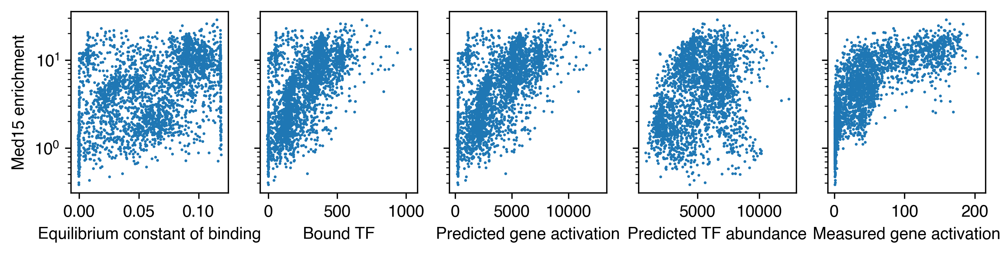

In [254]:
# sanborn_data_subset = sanborn_data_subset #[["War1" in name for name in sanborn_data['Unnamed: 0']]]
fig, axs = plt.subplots(1, 5, figsize=(10, 2), sharey=True)

axs[0].scatter(sanborn_data_subset['two_state_K'], sanborn_data_subset["Med15 enrichment"], s=0.5)
axs[0].set_yscale('log')
# axs[0].set_xscale('log')
axs[0].set_xlabel("Equilibrium constant of binding")
axs[0].set_ylabel("Med15 enrichment")


axs[1].scatter(sanborn_data_subset['bound'], sanborn_data_subset["Med15 enrichment"], s=0.5)
axs[1].set_yscale('log')
# axs[1].set_xscale('log')
axs[1].set_xlabel("Bound TF")

axs[2].scatter(sanborn_data_subset['two_state_gfp_pred'], sanborn_data_subset["Med15 enrichment"], s=0.5)
axs[2].set_yscale('log')
# axs[2].set_xscale('log')
axs[2].set_xlabel("Predicted gene activation")

axs[3].scatter(sanborn_data_subset['two_state_mcherry_pred'], sanborn_data_subset["Med15 enrichment"], s=0.5)
axs[3].set_yscale('log')
# axs[3].set_xscale('log')
axs[3].set_xlabel("Predicted TF abundance")


axs[4].scatter(sanborn_data_subset['activation'], sanborn_data_subset["Med15 enrichment"], s=0.5)
axs[4].set_yscale('log')
# axs[4].set_xscale('log')
axs[4].set_xlabel("Measured gene activation")


,Unnamed: 0,protein sequence,protein,protein ID,position,activation,Z score,num cells,"num cells, bin 1","num cells, bin 2","num cells, bin 3","num cells, bin 4","num cells, bin 5","num cells, bin 6","num cells, bin 7","num cells, bin 8",GFP average,GFP std,PADDLE split,DNA
0,A_controls_GAL4:147-199-1,SIDSAAHHDNSTIPLDFMPRDALHGFDWSEEDDMSDGLPFLKTDPN...,NaN,NaN,NaN,57.548023,9.943363,356.076490,0.000000,3.779039,7.274897,2.643274,44.965873,252.531089,44.882318,0.0,365.698574,2.296414,NaN,TCAATTGACAGTGCAGCCCACCACGACAACTCCACAATCCCGCTCG...
1,A_controls_GAL4:147-199-2,SIDSAAHHDNSTIPLDFMPRDALHGFDWSEEDDMSDGLPFLKTDPN...,NaN,NaN,NaN,57.043546,9.921760,234.350444,0.000000,10.581310,0.290996,0.146849,16.407870,177.212589,29.710830,0.0,362.492793,2.715165,NaN,TCAATAGACTCAGCCGCCCACCACGACAACTCCACCATCCCCCTCG...
2,A_controls_GAL4:147-199-3,SIDSAAHHDNSTIPLDFMPRDALHGFDWSEEDDMSDGLPFLKTDPN...,NaN,NaN,NaN,64.504302,10.223345,471.804061,0.327823,3.023231,10.184856,2.276153,46.108193,316.010225,93.873580,0.0,409.903419,2.295073,NaN,TCCATCGACTCAGCTGCTCACCACGACAACAGCACCATCCCCCTGG...
3,A_controls_GAL4:147-199-4,SIDSAAHHDNSTIPLDFMPRDALHGFDWSEEDDMSDGLPFLKTDPN...,NaN,NaN,NaN,70.852163,10.453645,371.846076,0.546372,0.755808,0.290996,3.671214,27.000293,268.148971,71.432421,0.0,450.241971,1.842646,NaN,TCTATCGATTCCGCGGCCCATCACGACAACTCCACAATTCCTCTCG...
4,A_controls_GAL4:147-199-5,SIDSAAHHDNSTIPLDFMPRDALHGFDWSEEDDMSDGLPFLKTDPN...,NaN,NaN,NaN,55.185796,9.840524,316.519152,0.109274,7.558078,1.745975,6.387913,39.565814,224.066238,37.085859,0.0,350.687407,2.448407,NaN,AGCATTGACTCTGCCGCCCATCACGACAACAGCACGATCCCATTGG...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7642,A_controls-mean_MSN2,YSNSISNSNSNSTGNLNSSYFNSLNIDSMLDDYVSSDLLLNDDDDD...,MSN2,P33748,233.0,33.465448,8.613270,3430.064598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,212.661808,2.389741,val6,TACAGTAACAGCATCTCCAATAGCAATTCCAACTCAACCGGCAACC...
7643,A_controls-mean_OAF1,NNSINATPIVDNSSGSQLPNGFDRGQANNTPFPGYFGGLDLFDYDF...,OAF1,P39720,994.0,91.456145,11.079952,6149.941960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,581.173430,2.686007,test,AACAACTCCATCAACGCCACCCCTATTGTGGACAACAGTTCTGGAA...
7644,A_controls-mean_PIP2,SGSNINNNDNVKLPSNFKNYYDPPMSSLDISMDVPDIFGSLDFFDY...,PIP2,P52960,943.0,148.709474,12.272715,6096.192505,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,944.999324,2.280292,test,TCCGGCAGTAATATTAACAACAATGACAACGTCAAGCTGCCGAGCA...
7645,A_controls-mean_VP16,EVDMTPADALDDFDLEMLGDVESPSPGMTHDPVSYGALDVDDFEFE...,NaN,NaN,NaN,126.427883,11.874446,7388.431153,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,803.407216,2.176304,val6,GAGGTGGATATGACACCTGCAGACGCTCTGGACGATTTCGACCTCG...


In [102]:
pearsonr(merged_data.dropna()['activation'], merged_data.dropna()['Med15 enrichment'])

PearsonRResult(statistic=0.7203030323084216, pvalue=0.0)

In [103]:
spearmanr(merged_data.dropna()['activation'], merged_data.dropna()['Med15 enrichment'])

SignificanceResult(statistic=0.366247692776407, pvalue=5.459281188057157e-221)

In [100]:
merged_data.columns

Index(['Unnamed: 0_x', 'protein sequence', 'protein_x', 'protein ID_x',
       'position_x', 'Med15 pulldown', 'Med15 enrichment', 'Med15 Z score',
       'Med15 pulldown rep1', 'Med15 pulldown rep2', 'Med15 pulldown rep3',
       'Med15 enrichment rep1', 'Med15 enrichment rep2',
       'Med15 enrichment rep3', 'TFIID pulldown', 'TFIID enrichment',
       'TFIID Z score', 'TFIID pulldown rep1', 'TFIID pulldown rep2',
       'TFIID enrichment rep1', 'TFIID enrichment rep2', 'DNA_x', 'tile',
       'Unnamed: 0_y', 'protein_y', 'protein ID_y', 'position_y', 'activation',
       'Z score', 'num cells', 'num cells, bin 1', 'num cells, bin 2',
       'num cells, bin 3', 'num cells, bin 4', 'num cells, bin 5',
       'num cells, bin 6', 'num cells, bin 7', 'num cells, bin 8',
       'GFP average', 'GFP std', 'PADDLE split', 'DNA_y'],
      dtype='object')

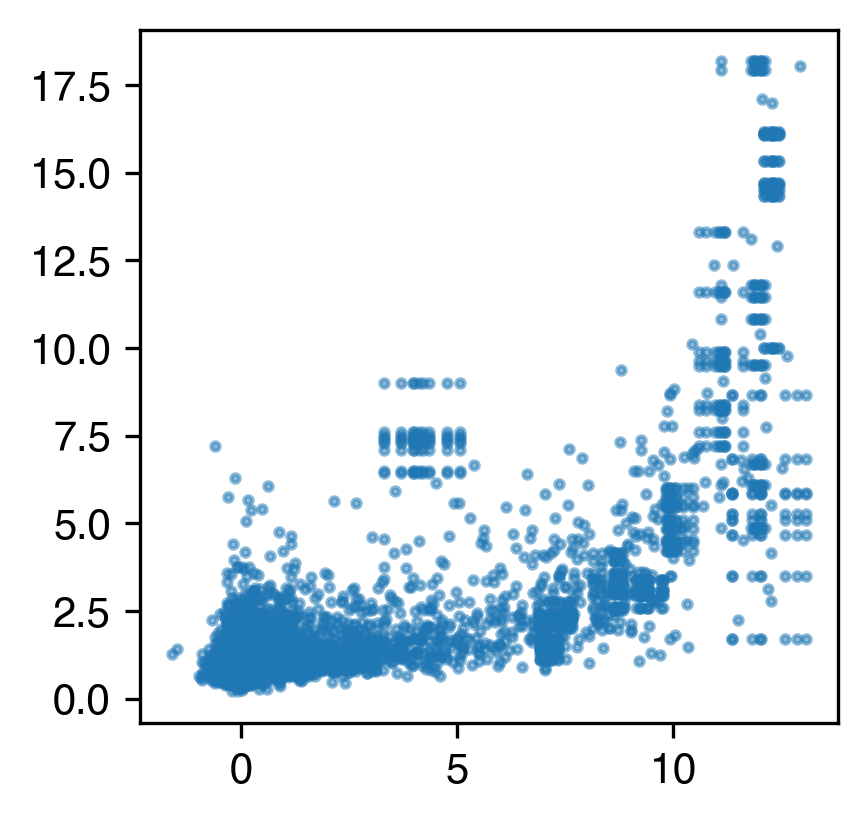

In [106]:
plt.figure(figsize=(3, 3))
plt.scatter(merged_data['Z score'], merged_data['Med15 enrichment'], alpha=0.5, s=4)

# plt.xscale('log')
# plt.yscale('log')